# Investigate Arrival Time Estimates
- Frequency Bands, Averaging Time, Second Whitening
- Trying to be very careful versioning of the various code that I'm using
All scripts were run with most up to date commits as of 07-12-2023

## Calculate NCCF stack (8 years)
- 1 hour average NCCF is calculated with scripts/calculate_NCCFstack.py and saved to /datadrive/NCCFs/1hr_20150101_20230101_ec_cc_fcs_1_90.nc

### import packages

In [2]:
import xarray as xr
import pandas as pd
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import hvplot.xarray
from tqdm import tqdm
from dask.distributed import Client
import odlintake
from ooi_hydrophone_cloud import utils
from ni_tools import calculate, inversion
import xrsignal

import seaborn as sns

%load_ext autoreload
%autoreload 2

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
client = Client()
client

2023-09-15 21:29:01,301 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-9ad1r3vc', purging
2023-09-15 21:29:01,301 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-tv406k6l', purging
2023-09-15 21:29:01,301 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-g8xekiq6', purging
2023-09-15 21:29:01,302 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-5_v8ubtt', purging
2023-09-15 21:29:01,302 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-uac2__ji', purging
2023-09-15 21:29:01,302 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-ckhwobb_', purging
2023-09-15 21:29:01,302 - distributed.diskutils - INFO - Found stale lock file and directory '/tmp/dask-worker-space/worker-wj2jc6om', purging

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.79 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:40847,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.79 GiB
Comm: tcp://127.0.0.1:35019,Total threads: 4
Dashboard: http://127.0.0.1:33309/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:34245,


## Calculate Different Averages of NCCF
- due to memory issues, this was put in seperate script
- ooi_NI_inversion/scripts/average_NCCFs.py

due to results in outlier_remove.ipynb, outlier threshold is set to 3.4 and outlier hour long NCCFs are removed

## Calculate arrival times
- different bands (1-5, 1-fc, 1-90)
- different average hours (201, 601, 1001)
- with and without second whitening

#### Define Cutoffs
- these are calculated in ooi_NI_inversion/notebook_archive/peak_elbows.ipynb

In [2]:
average_hours = [201, 601, 1001]

cutoffs_201 = {
    'dA':38.49644799876388,
    's1b0A':46.45346687092607,
    's1b0B':35.528258201431036,
    's2b1A':31.60147483493909,
    's2b1B':18.426651669398172
}

cutoffs_601 = {
    'dA':40.55017262364214,
    's1b0A':54.724490650555055,
    's1b0B':38.998664801096524,
    's2b1A':34.214072643236165,
    's2b1B':24.394969444999766
}

cutoffs_1001 = {
    'dA':42.36289799469905,
    's1b0A':60.603626021214424,
    's1b0B':40.2010426874647,
    's2b1A':35.17584754198018,
    's2b1B':26.25266444094792
}

cutoffs = {
    '201':cutoffs_201,
    '601':cutoffs_601,
    '1001':cutoffs_1001
}

### No Second Whitening

In [3]:
peaks = ['dA', 's1b0A', 's1b0B', 's2b1A', 's2b1B']
peak_slices = dict(zip(peaks, [slice(-2.5, -1.5), slice(-3.5, -2.5), slice(2.5, 3.5), slice(-5, -4), slice(4,5)]))
average_hours = [201, 601, 1001]

for average_hour in average_hours:
    print(f'{average_hour} hr...')
    
    fn = f'/datadrive/NCCFs/averaged/{average_hour}.nc'
    NCCFs = xr.open_dataarray(fn)
    NCCFs = NCCFs.chunk({'time':100, 'delay':11999})
    
    # Filter between 1 - 5 Hz
    b,a = signal.butter(4, [0.01, 0.05], btype='bandpass')
    NCCFs_1_5 = xrsignal.filtfilt(NCCFs,dim='delay', b=b, a=a)
    
    # Filter between 1 - fc (fc is dependant on peak)
    NCCFs_1_fc = {}
    for peak in peaks:        
        fc = cutoffs[str(average_hour)][peak]
        b,a = signal.butter(4, [0.01, fc/100], btype='bandpass')
        NCCFs_1_fc[peak] = xrsignal.filtfilt(NCCFs,dim='delay', b=b, a=a).sel({'delay':peak_slices[peak]})
    
    # calculate arrival times
    ## 1 - 5 Hz
    print('   1-5 Hz...')
    at_1_5 = inversion.calculate_arrival_times(NCCFs_1_5.compute(), dim='delay')
    
    ## 1 - fc Hz
    print('   1-fc Hz...')
    at_1_fc = {}
    for peak in peaks:
        print(f'      {peak}')
        at_1_fc[peak] = inversion.calculate_peak_arrival_time(NCCFs_1_fc[peak].compute(), dim='delay')
    at_1_fc = xr.Dataset(at_1_fc)
    
    ## 1 - 90 Hz
    print('   1-90 Hz...')
    at_1_90 = inversion.calculate_arrival_times(NCCFs.compute(), dim='delay')
    
    # save average times
    fn = f'/datadrive/NCCFs/arrival_times/arrivaltime_{average_hour}hr_1-5Hz.nc'
    at_1_5.to_netcdf(fn)
    
    fn = f'/datadrive/NCCFs/arrival_times/arrivaltime_{average_hour}hr_1-fcHz.nc'
    at_1_fc.to_netcdf(fn)
    
    fn = f'/datadrive/NCCFs/arrival_times/arrivaltime_{average_hour}hr_1-90Hz.nc'
    at_1_90.to_netcdf(fn)

201 hr...


NameError: name 'xrsignal' is not defined

### With Second Whitening

In [ ]:
peaks = ['dA', 's1b0A', 's1b0B', 's2b1A', 's2b1B']
peak_slices = dict(zip(peaks, [slice(-2.5, -1.5), slice(-3.5, -2.5), slice(2.5, 3.5), slice(-5, -4), slice(4,5)]))
average_hours = [201, 601, 1001]

for average_hour in average_hours:
    print(f'{average_hour} hr...')
    
    fn = f'/datadrive/NCCFs/averaged/{average_hour}.nc'
    NCCFs = xr.open_dataarray(fn)
    NCCFs = NCCFs.chunk({'time':100, 'delay':11999})
    
    # Filter between 1 - 5 Hz
    b,a = signal.butter(4, [0.01, 0.05], btype='bandpass')
    NCCFs_1_5 = xrsignal.filtfilt(NCCFs,dim='delay', b=b, a=a)
    
    # Filter between 1 - fc (fc is dependant on peak)
    NCCFs_1_fc = {}
    for peak in peaks:        
        fc = cutoffs[str(average_hour)][peak]
        b,a = signal.butter(4, [0.01, fc/100], btype='bandpass')
        NCCFs_1_fc[peak] = xrsignal.filtfilt(NCCFs,dim='delay', b=b, a=a).sel({'delay':peak_slices[peak]})
    
    # calculate arrival times
    ## 1 - 5 Hz
    print('   1-5 Hz...')
    b,a = signal.butter(4, [0.01, 0.05], btype='bandpass')
    at_1_5 = inversion.calculate_arrival_times(NCCFs_1_5.compute(), dim='delay', b=b, a=a, second_whiten=True)
    
    ## 1 - fc Hz
    print('   1-fc Hz...')
    at_1_fc = {}
    for peak in peaks:
        print(f'      {peak}')
        b,a = signal.butter(4, [0.01, cutoffs[str(average_hour)][peak]/100], btype='bandpass')
        at_1_fc[peak] = inversion.calculate_peak_arrival_time(
            NCCFs_1_fc[peak].compute(),
            dim='delay',
            b=b,
            a=a,
            second_whiten=True
        )
        
    at_1_fc = xr.Dataset(at_1_fc)
    
    ## 1 - 90 Hz
    print('   1-90 Hz...')
    b,a = signal.butter(4, [0.01, 0.90], btype='bandpass')
    at_1_90 = inversion.calculate_arrival_times(NCCFs.compute(), dim='delay', b=b, a=a, second_whiten=True)
    
    # save average times
    fn = f'/datadrive/NCCFs/arrival_times/{average_hour}hr_1-5Hz_secondwhiten.nc'
    at_1_5.to_netcdf(fn)
    
    fn = f'/datadrive/NCCFs/arrival_times/{average_hour}hr_1-fcHz_secondwhiten.nc'
    at_1_fc.to_netcdf(fn)
    
    fn = f'/datadrive/NCCFs/arrival_times/{average_hour}hr_1-90Hz_secondwhiten.nc'
    at_1_90.to_netcdf(fn)

### considering $\frac{dC}{d\tau}$

In [3]:
fn = '/datadrive/NCCFs/averaged/201.nc'
NCCFs = xr.open_dataarray(fn).chunk({'time':100, 'delay':11999})

In [4]:
dNCCFs = NCCFs.differentiate('delay')
dNCCFs.name = 'dNCCFs'

In [5]:
peaks = ['dA', 's1b0A', 's1b0B', 'dB']
peak_slices = dict(zip(peaks, [slice(-2.5, -1.5), slice(-3.5, -2.5), slice(2.5, 3.5), slice(1.5, 2.5)]))

at = inversion.calculate_arrival_times(dNCCFs.compute(), dim='delay', peaks=peak_slices)

In [10]:
at.to_netcdf('/datadrive/NCCFs/arrival_times/201hr_1-90Hz_derivative.nc')

# Explore results

In [1]:
import xarray as xr
import numpy as np
import hvplot.xarray
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from ni_tools import inversion
from matplotlib import gridspec
from tqdm import tqdm
from matplotlib.colors import LogNorm, Normalize
from scipy import stats
import scipy
import xrsignal

from dask.distributed import Client
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 32,Total memory: 62.79 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36547,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 32
Started: Just now,Total memory: 62.79 GiB
Comm: tcp://127.0.0.1:39665,Total threads: 4
Dashboard: http://127.0.0.1:42841/status,Memory: 7.85 GiB
Nanny: tcp://127.0.0.1:45649,


### load all arrival times

arrival_times[avg_hour][cutoff][whiten][peak]

#### estimated arrival times

In [3]:
fn = '/datadrive/NCCFs/arrival_times/201hr_1-5Hz_secondwhiten.nc'
at_201_5_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/601hr_1-5Hz_secondwhiten.nc'
at_601_5_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/1001hr_1-5Hz_secondwhiten.nc'
at_1001_5_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/201hr_1-fcHz_secondwhiten.nc'
at_201_fc_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/601hr_1-fcHz_secondwhiten.nc'
at_601_fc_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/1001hr_1-fcHz_secondwhiten.nc'
at_1001_fc_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/201hr_1-90Hz_secondwhiten.nc'
at_201_90_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/601hr_1-90Hz_secondwhiten.nc'
at_601_90_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/1001hr_1-90Hz_secondwhiten.nc'
at_1001_90_w = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/201hr_1-5Hz.nc'
at_201_5 = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/601hr_1-5Hz.nc'
at_601_5 = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/1001hr_1-5Hz.nc'
at_1001_5 = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/201hr_1-fcHz.nc'
at_201_fc = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/601hr_1-fcHz.nc'
at_601_fc = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/1001hr_1-fcHz.nc'
at_1001_fc = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/201hr_1-90Hz.nc'
at_201_90 = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/601hr_1-90Hz.nc'
at_601_90 = xr.open_dataset(fn)

fn = '/datadrive/NCCFs/arrival_times/1001hr_1-90Hz.nc'
at_1001_90 = xr.open_dataset(fn)

## create single dictionary
arrival_times = {
    '201':{
        '5':{
            'nw':at_201_5,
            'w':at_201_5_w,
        },
        'fc':{
            'nw':at_201_fc,
            'w':at_201_fc_w,
        },
        '90':{
            'nw':at_201_90,
            'w':at_201_90_w,
        },
    },
    '601':{
        '5':{
            'nw':at_601_5,
            'w':at_601_5_w,
        },
        'fc':{
            'nw':at_601_fc,
            'w':at_601_fc_w,
        },
        '90':{
            'nw':at_601_90,
            'w':at_601_90_w,
        },
    },
    '1001':{
        '5':{
            'nw':at_1001_5,
            'w':at_1001_5_w,
        },
        'fc':{
            'nw':at_1001_fc,
            'w':at_1001_fc_w,
        },
        '90':{
            'nw':at_1001_90,
            'w':at_1001_90_w,
        },
    },
}

In [4]:
# I'm gonna try a dataarray
# 201 hours
fc5 = xr.concat((at_201_5.to_array().rename({'variable':'peak'}), at_201_5_w.to_array().rename({'variable':'peak'})), dim='whiten')
fcfc = xr.concat((at_201_fc.to_array().rename({'variable':'peak'}), at_201_fc_w.to_array().rename({'variable':'peak'})), dim='whiten')
fc90 = xr.concat((at_201_90.to_array().rename({'variable':'peak'}), at_201_90_w.to_array().rename({'variable':'peak'})), dim='whiten')

arrival_times_201 = xr.concat((fc5, fcfc, fc90), dim='cutoff').assign_coords({'cutoff':['5','fc','90'], 'whiten':['nw','w']})
arrival_times_201.name='201 avg hours'

# 601 hours
fc5 = xr.concat((at_601_5.to_array().rename({'variable':'peak'}), at_601_5_w.to_array().rename({'variable':'peak'})), dim='whiten')
fcfc = xr.concat((at_601_fc.to_array().rename({'variable':'peak'}), at_601_fc_w.to_array().rename({'variable':'peak'})), dim='whiten')
fc90 = xr.concat((at_601_90.to_array().rename({'variable':'peak'}), at_601_90_w.to_array().rename({'variable':'peak'})), dim='whiten')

arrival_times_601 = xr.concat((fc5, fcfc, fc90), dim='cutoff').assign_coords({'cutoff':['5','fc','90'], 'whiten':['nw','w']})
arrival_times_601.name='201 avg hours'

# 1001 hours
fc5 = xr.concat((at_1001_5.to_array().rename({'variable':'peak'}), at_1001_5_w.to_array().rename({'variable':'peak'})), dim='whiten')
fcfc = xr.concat((at_1001_fc.to_array().rename({'variable':'peak'}), at_1001_fc_w.to_array().rename({'variable':'peak'})), dim='whiten')
fc90 = xr.concat((at_1001_90.to_array().rename({'variable':'peak'}), at_1001_90_w.to_array().rename({'variable':'peak'})), dim='whiten')

arrival_times_1001 = xr.concat((fc5, fcfc, fc90), dim='cutoff').assign_coords({'cutoff':['5','fc','90'], 'whiten':['nw','w']})
arrival_times_1001.name='201 avg hours'

In [5]:
avg_hours = ['201', '601', '1001']
at_full = {
    '201':arrival_times_201,
    '601':arrival_times_601,
    '1001':arrival_times_1001
}

# flip all lag arrival times to be positive
for peak in ['dA', 's1b0A', 's2b1A']:
    at_full['201'].loc[{'peak':peak}] = -1*at_full['201'].sel({'peak':peak})
    at_full['601'].loc[{'peak':peak}] = -1*at_full['601'].sel({'peak':peak})
    at_full['1001'].loc[{'peak':peak}] = -1*at_full['1001'].sel({'peak':peak})

In [6]:
atd = xr.open_dataset('/datadrive/NCCFs/arrival_times/201hr_1-90Hz_derivative.nc')

#### simulated arrival times

- it looks like the simulation that I ran was once per day, despite the change time resolution of HYCOM... </br>**This is something to look into**

In [7]:
fn = '/datadrive/simulation/caldera_inversion_timeseries_HYCOM2.nc'
tdgf = xr.open_dataarray(fn)

# hand remove outlier
tdgf.loc[pd.Timestamp('2018-02-27'),:] = np.nan

at_sim = inversion.calculate_arrival_times(
    tdgf,
    dim='time',
    peaks={
        'dA':slice(1.5, 2.5),
        's1b0A':slice(2.5, 3.5),
        's1b0B':slice(2.5, 3.5),
        's2b1A':slice(4,5),
        's2b1B':slice(4,5)
    }
)

In [8]:
# resample to be 201 hour average arrival time
time_coord = pd.date_range(pd.Timestamp('2015-01-01'), pd.Timestamp('2022-12-31 T23:59:59.999'), freq='1H')
at_sim_1hr = at_sim.interp({'date':time_coord}, method='cubic')
at_sim_201hr = at_sim_1hr.rolling(date=201, center=True).mean()
at_sim_601hr = at_sim_1hr.rolling(date=601, center=True).mean()
at_sim_1001hr = at_sim_1hr.rolling(date=1001, center=True).mean()

# resample to match no nan time coord of estimated arrival time
at_sim_201hr_rs = at_sim_201hr.interp(date=at_full['201'].sel({'cutoff':'90', 'whiten':'w', 'peak':'s1b0A'}).time.values, method='linear')
at_sim_201hr_rs = at_sim_201hr_rs.rename({'date':'time'})

at_sim_601hr_rs = at_sim_601hr.interp(date=at_full['601'].sel({'cutoff':'90', 'whiten':'w', 'peak':'s1b0A'}).time.values, method='linear')
at_sim_601hr_rs = at_sim_601hr_rs.rename({'date':'time'})

at_sim_1001hr_rs = at_sim_1001hr.interp(date=at_full['1001'].sel({'cutoff':'90', 'whiten':'w', 'peak':'s1b0A'}).time.values, method='linear')
at_sim_1001hr_rs = at_sim_1001hr_rs.rename({'date':'time'})

In [9]:
at_sim_full = {
    '201':at_sim_201hr_rs.to_array(dim='peak'),
    '601':at_sim_601hr_rs.to_array(dim='peak'),
    '1001':at_sim_1001hr_rs.to_array(dim='peak')
}

simulated and estimated arrivals are off by 5 ms</br>
we're attributing this to an error in geometry</br></br>
5 ms corresponds to 7 m (for $c=1500\frac{m}{s}$)

## Error Analysis

### compare with and without differentiation

In [10]:
lag_error = at_sim_full['201'].sel({'peak':'s1b0A'}) - at_full['201'].sel({'cutoff':'90','whiten':'nw','peak':'s1b0A'})
lead_error = at_sim_full['201'].sel({'peak':'s1b0B'}) - at_full['201'].sel({'cutoff':'90','whiten':'nw','peak':'s1b0B'})
dlag_error = at_sim_full['201'].sel({'peak':'s1b0A'}) - (atd['s1b0A']*-1)
dlead_error = at_sim_full['201'].sel({'peak':'s1b0A'}) - (atd['s1b0B'])

In [55]:
lag_hist,b = np.histogram(lag_error.dropna('time'), bins = np.linspace(-0.02, 0.005, 1000), density=True)
lead_hist,b = np.histogram(lead_error.dropna('time'), bins = np.linspace(-0.02, 0.005, 1000), density=True)
dlag_hist,b = np.histogram(dlag_error.dropna('time'), bins = np.linspace(-0.02, 0.005, 1000), density=True)
dlead_hist,b = np.histogram(dlead_error.dropna('time'), bins = np.linspace(-0.02, 0.005, 1000), density=True)

In [64]:
def gaussian(x, mu, sigma):
    return np.exp(-(x - mu)**2 / (2 * sigma**2)) / (np.sqrt(2*np.pi)*sigma)

In [65]:
# get center of bins (instead of edges)
bin_width = np.mean(np.diff(b))
b_center = b[:-1] + bin_width/2

In [68]:
# fit gaussian pdf
params_lag, cov = scipy.optimize.curve_fit(gaussian, b_center, lag_hist)
params_lead, cov = scipy.optimize.curve_fit(gaussian, b_center, lead_hist)
params_dlag, cov = scipy.optimize.curve_fit(gaussian, b_center, dlag_hist)
params_dlead, cov = scipy.optimize.curve_fit(gaussian, b_center, dlead_hist)

In [143]:
print('------$\mu$-------')
print(f'lag\t{params_lag[0]*1000:0.4}')
print(f'lead\t{params_lead[0]*1000:0.4}')
print(f'dlag\t{params_dlag[0]*1000:0.4}')
print(f'dlead\t{params_dlead[0]*1000:0.4}')
print('------$\sigma$-------')
print(f'lag\t{params_lag[1]*1000:0.4}')
print(f'lead\t{params_lead[1]*1000:0.4}')
print(f'dlag\t{params_dlag[1]*1000:0.4}')
print(f'dlead\t{params_dlead[1]*1000:0.4}')

------$\mu$-------
lag	-4.389
lead	-5.265
dlag	-3.843
dlead	-3.305
------$\sigma$-------
lag	1.364
lead	1.273
dlag	1.562
dlead	1.386


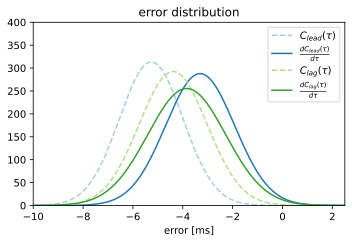

In [139]:
sns.set_palette('Paired')
fig = plt.figure(figsize=(5,3.5))


plt.plot(b_center*1000, gaussian(b_center, params_lead[0], params_lead[1]), linestyle='--', label='$C_{lead}(\\tau)$')
plt.plot(b_center*1000, gaussian(b_center, params_dlead[0], params_dlead[1]), label='$\\frac{dC_{lead}(\\tau)}{d\\tau}$')
plt.plot(b_center*1000, gaussian(b_center, params_lag[0], params_lag[1]), linestyle='--', label='$C_{lag}(\\tau)$')
plt.plot(b_center*1000, gaussian(b_center, params_dlag[0], params_dlag[1]), label='$\\frac{dC_{lag}(\\tau)}{d\\tau}$')

plt.ylim([0,400])
plt.xlim([-0.01*1000, 0.0025*1000])

#plt.text(-0.014, 300, f'$\mu = {params_lead[0]*1000:0.3} \ ms$\n$\sigma = {params_lead[1]*1000:0.3} \ ms$', fontsize=12)
#plt.text(-0.014, 225, f'$\mu = {params_dlead[0]*1000:0.3} \ ms$\n$\sigma = {params_dlead[1]*1000:0.3} \ ms$', fontsize=12, c='r')
#plt.text(-0.014, 150, f'$\mu = {params_lag[0]*1000:0.3} \ ms$\n$\sigma = {params_lag[1]*1000:0.3} \ ms$', fontsize=12)
#plt.text(-0.014, 75, f'$\mu = {params_dlag[0]*1000:0.3} \ ms$\n$\sigma = {params_dlag[1]*1000:0.3} \ ms$', fontsize=12, c='r')
plt.title('error distribution')

plt.legend()
plt.xlabel('error [ms]')
plt.tight_layout()

Text(0.5, 1.0, 'distribution of errors with and without differentiation')

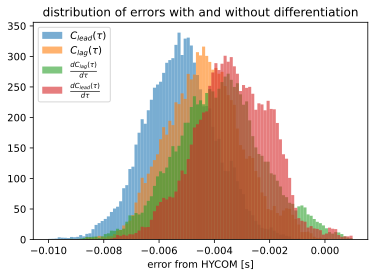

In [21]:
_ = lead_error.plot.hist(bins=np.linspace(-0.01,0.001,100), alpha=0.6, density=True, label='$C_{lead}(\\tau)}$')
_ = lag_error.plot.hist(bins=np.linspace(-0.01,0.001,100), alpha=0.6, density=True, label='$C_{lag}(\\tau)}$')
_ = dlag_error.plot.hist(bins=np.linspace(-0.01,0.001,100), alpha=0.6, density=True, label='$\\frac{d C_{lag}(\\tau)}{d\\tau}$')
_ = dlead_error.plot.hist(bins=np.linspace(-0.01,0.001,100), alpha=0.6, density=True, label='$\\frac{d C_{lead}(\\tau)}{d\\tau}$')

plt.legend(loc='upper left')
plt.xlabel('error from HYCOM [s]')
plt.title('distribution of errors with and without differentiation')

Text(0, 0.5, 'density')

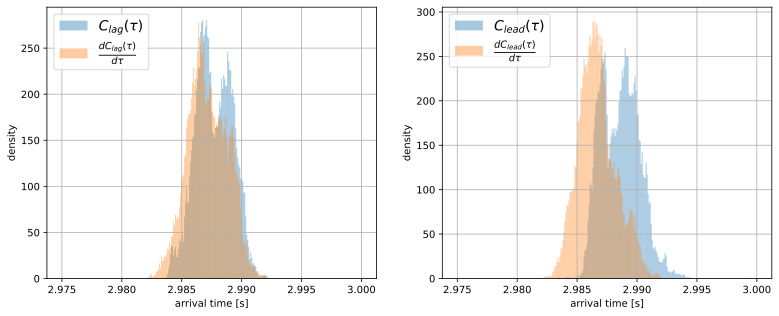

In [23]:
fig = plt.figure(figsize=(13,5))
plt.subplot(1,2,1)
_ = at_full['201'].sel({'cutoff':'90','whiten':'nw','peak':'s1b0A'}).plot.hist(bins=np.linspace(2.975, 3, 300), density=True, label='$C_{lag}(\\tau)$', alpha=0.4)
_ = (atd['s1b0A']*-1).plot.hist(bins=np.linspace(2.975, 3, 300), density = True, label='$\\frac{d C_{lag}(\\tau)}{d\\tau}$', alpha=0.4)
plt.legend(ncol=1, loc='upper left', fontsize=14)
plt.grid()
plt.xlabel('arrival time [s]')
plt.ylabel('density')

plt.subplot(1,2,2)
_ = at_full['201'].sel({'cutoff':'90','whiten':'nw','peak':'s1b0B'}).plot.hist(bins=np.linspace(2.975, 3, 300), density=True, label='$C_{lead}(\\tau)$', alpha=0.4)
_ = (atd['s1b0B']).plot.hist(bins=np.linspace(2.975, 3, 300), density = True, label='$\\frac{d C_{lead}(\\tau)}{d\\tau}$', alpha=0.4)
plt.legend(ncol=1, loc='upper left', fontsize=14)
plt.grid()
plt.xlabel('arrival time [s]')
plt.ylabel('density')

### distribution before / after 2019

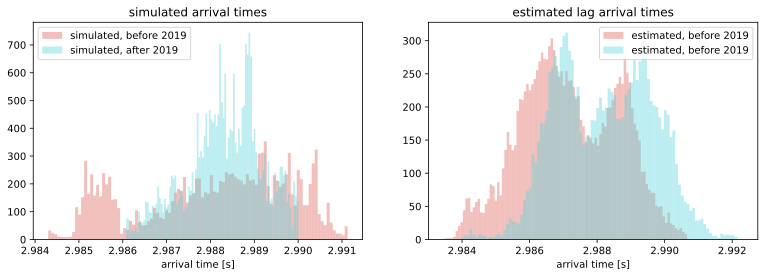

In [97]:
fig = plt.figure(figsize=(13,4))
sns.set_palette('hls',2)
plt.subplot(1,2,1)
_ = (at_sim_full['201']+0.004844).loc['s1b0A', :pd.Timestamp('2019-01-01')].plot.hist(bins=100, alpha=0.4, density=True, label='simulated, before 2019')
_ = (at_sim_full['201']+0.004844).loc['s1b0A', pd.Timestamp('2019-01-01'):].plot.hist(bins=100, alpha=0.4, density=True, label='simulated, after 2019')
plt.title('simulated arrival times')
plt.legend()
plt.xlabel('arrival time [s]')

plt.subplot(1,2,2)
_ = at_full['201'].sel({'peak':'s1b0A', 'cutoff':'90', 'whiten':'nw'}).loc[:pd.Timestamp('2019-01-01')].plot.hist(bins=100, alpha=0.4, density=True, label='estimated, before 2019')
_ = at_full['201'].sel({'peak':'s1b0A', 'cutoff':'90', 'whiten':'nw'}).loc[pd.Timestamp('2019-01-01'):].plot.hist(bins=100, alpha=0.4, density=True, label='estimated, before 2019')
plt.title('estimated lag arrival times')
plt.xlabel('arrival time [s]')

plt.legend()

### fitting gaussian distribution to errors

In [52]:
def gaussian(x, mu, sigma):
    return np.exp(-(x - mu)**2 / (2 * sigma**2)) / (np.sqrt(2*np.pi)*sigma)

In [63]:
s1b0_e = errors.sel({'avg_hour':'201', 'cutoff':'90', 'whiten':'nw', 'peak':['s1b0A','s1b0B']})

H,b = np.histogram(s1b0_e.where(~np.isnan(s1b0_e), drop=True), bins=1000, density=True)

# get center of bins (instead of edges)
bin_width = np.mean(np.diff(b))
b_center = b[:-1] + bin_width/2

In [73]:
# fit gaussian pdf
params, cov = scipy.optimize.curve_fit(gaussian, b_center, H)

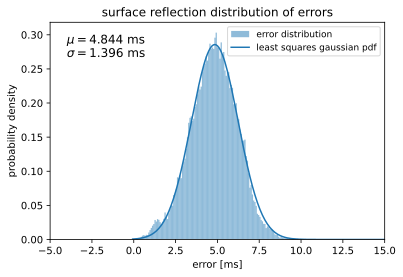

In [110]:
_ = (1000*s1b0_e).plot.hist(bins=1000, density=True, alpha=0.5, color='C0', label='error distribution')
plt.plot(1000*b_center, gaussian(b_center, params[0], params[1])/1000, c='C0', label='least squares gaussian pdf')

plt.xlim([-5, 15])
plt.text(0.05,0.84,f'$ \\mu = {params[0]*1000:0.4}$ ms\n$\\sigma = {1000*params[1]:0.04}$ ms', transform=plt.gca().transAxes, fontsize=12)
plt.legend(loc='upper right', fontsize=9)
plt.title('surface reflection distribution of errors')
plt.xlabel('error [ms]')
plt.ylabel('probability density')

plt.savefig('figures/distribution_of_errors.svg')

#### create error offset simulated values

In [131]:
at_sim_offset = {
    '201':at_sim_full['201'].sel({'peak':['s1b0A','s1b0B']}) + params[0],
    '601':at_sim_full['601'].sel({'peak':['s1b0A','s1b0B']}) + params[0],
    '1001':at_sim_full['1001'].sel({'peak':['s1b0A','s1b0B']}) + params[0]
}

### calculate errors and mean absolute erros
- **with** and **without** offset

In [137]:
avg_hours = ['201', '601', '1001']

maes=[]
es=[]
for avg_hour in avg_hours:
    maes.append(np.abs(at_full[avg_hour] - at_sim_full[avg_hour]).mean('time'))
    es.append(at_full[avg_hour] - at_sim_full[avg_hour])
    
maes = xr.concat(maes, dim='avg_hour').assign_coords({'avg_hour':avg_hours})
errors = xr.concat(es, dim='avg_hour').assign_coords({'avg_hour':avg_hours})

with offset is only for **surface reflection**

In [138]:
avg_hours = ['201', '601', '1001']

maes_offset=[]
es_offset=[]
for avg_hour in avg_hours:
    maes_offset.append(np.abs(at_full[avg_hour].sel({'peak':['s1b0A','s1b0B']}) - at_sim_offset[avg_hour]).mean('time'))
    es_offset.append(at_full[avg_hour].sel({'peak':['s1b0A','s1b0B']}) - at_sim_offset[avg_hour])
    
maes_offset = xr.concat(maes_offset, dim='avg_hour').assign_coords({'avg_hour':avg_hours})
errors_offset = xr.concat(es_offset, dim='avg_hour').assign_coords({'avg_hour':avg_hours})

#### before / after 2019

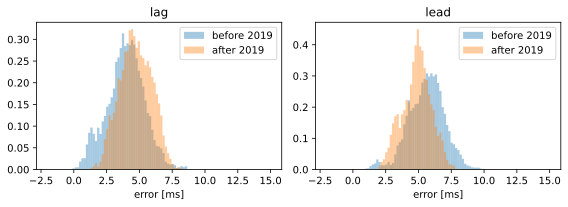

In [34]:
fig = plt.figure(figsize=(8,3))
plt.subplot(1,2,1)
_ = (1e3*errors).sel({'avg_hour':'201', 'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A', 'time':slice(None, pd.Timestamp('2019-01-01'))}).plot.hist(bins=np.linspace(-2, 15, 100), alpha=0.4, label='before 2019', density=True)
_ = (1e3*errors).sel({'avg_hour':'201', 'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A', 'time':slice(pd.Timestamp('2019-01-01'), None)}).plot.hist(bins=np.linspace(-2, 15, 100), alpha=0.4, label='after 2019', density=True)
plt.title('lag')
plt.legend()
plt.xlabel('error [ms]')

plt.subplot(1,2,2)
_ = (1e3*errors).sel({'avg_hour':'201', 'cutoff':'90', 'whiten':'nw', 'peak':'s1b0B', 'time':slice(None, pd.Timestamp('2019-01-01'))}).plot.hist(bins=np.linspace(-2, 15, 100), alpha=0.4, label='before 2019', density=True)
_ = (1e3*errors).sel({'avg_hour':'201', 'cutoff':'90', 'whiten':'nw', 'peak':'s1b0B', 'time':slice(pd.Timestamp('2019-01-01'), None)}).plot.hist(bins=np.linspace(-2, 15, 100), alpha=0.4, label='after 2019', density=True)
plt.title('lead')
plt.xlabel('error [ms]')

plt.legend()
plt.tight_layout()

fig.savefig('figures/before_after_2019_errors_s1b0.svg')

(2.979, 3.0)

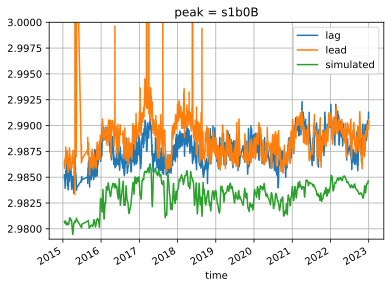

In [111]:
at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A'}).plot(label='lag')
at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0B'}).plot(label='lead')
at_sim_full['201'].sel({'peak':'s1b0B'}).plot(label='simulated')
plt.legend()
plt.grid()
plt.ylim([2.979, 3])

### distribution of errors for different feature extraction methods

In [144]:
avg_hours = [201]

for avg_hour in avg_hours:
    fig, axes = plt.subplots(1,2,figsize=(10,4))
    fig.suptitle(f'distribution of errors - {avg_hour} hours')

    plt.sca(axes[0])
    H1 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=90, no whiten')
    H2 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'fc', 'whiten':'nw', 'peak':'s1b0A'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=fc, no whiten')
    H1 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'90', 'whiten':'w', 'peak':'s1b0A'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=90, 2nd whiten')
    H2 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'fc', 'whiten':'w', 'peak':'s1b0A'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=fc, 2nd whiten')
    plt.xlim([-10, 10])
    plt.xlabel('error [ms]')
    plt.title('s1b0A')


    plt.sca(axes[1])
    H1 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'90', 'whiten':'nw', 'peak':'s1b0B'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=90, no whiten')
    H2 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'fc', 'whiten':'nw', 'peak':'s1b0B'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=fc, no whiten')
    H1 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'90', 'whiten':'w', 'peak':'s1b0B'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=90, 2nd whiten')
    H2 = (1e3*errors_offset).sel({'avg_hour':str(avg_hour), 'cutoff':'fc', 'whiten':'w', 'peak':'s1b0B'}).plot.hist(bins=np.linspace(-15, 15, 250), density=True, alpha=0.5, label='fc=fc, 2nd whiten')
    plt.xlim([-10, 10])
    plt.xlabel('error [ms]')
    plt.title('s1b0B')
    plt.legend(ncol=1, fontsize=8)

    fig.savefig(f'figures/error_distribution_{avg_hour}.svg')
    plt.close()

### full heatmap plot

/tmp/ipykernel_2100/3573920471.py:63: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


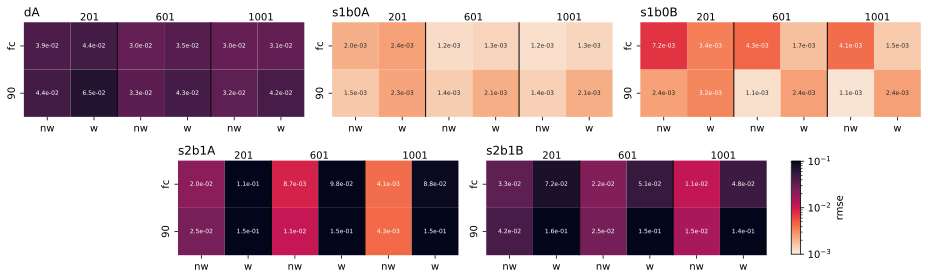

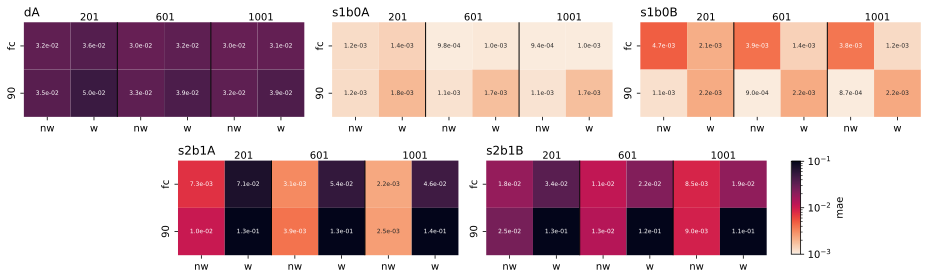

In [351]:
error_types = ['rmse','mae']
cmap = 'rocket_r'

for error_type in error_types:
    gs = gridspec.GridSpec(2,6)
    fig = plt.figure(figsize=(13,4))

    ax1 = fig.add_subplot(gs[0,:2])
    ax2 = fig.add_subplot(gs[0,2:4])
    ax3 = fig.add_subplot(gs[0,4:6])
    ax4 = fig.add_subplot(gs[1,1:3])
    ax5 = fig.add_subplot(gs[1,3:5])

    axes = [ax1, ax2, ax3, ax4, ax5]

    peaks = ['dA', 's1b0A', 's1b0B', 's2b1A', 's2b1B']
    bounds = [1e-3, 1e-1]

    for k in range(5):
        plt.sca(axes[k])

        #im = plt.pcolormesh(
        #    (errors[error_type][:,1:,:,k].stack({'avg_white':['avg_hour','whiten']})),
        ##    cmap='Reds',
        #    #aspect='auto',
        #    norm=LogNorm(vmin=bounds[0], vmax=bounds[1])
        #)
        im = sns.heatmap(
            errors[error_type].stack({'avg_white':['avg_hour','whiten']})[1:,k,:],
            annot=True,
            norm=LogNorm(vmin=bounds[0], vmax=bounds[1]),
            fmt=".1e",
            annot_kws={'fontsize':6},
            cbar=False,
            cmap=cmap
        )

        _ = plt.xticks([0.5,1.5,2.5,3.5,4.5,5.5],['nw','w','nw','w','nw','w'])
        _ = plt.yticks([0.5, 1.5],['fc','90'])
        plt.text(0.2, 1.02, '201', transform=plt.gca().transAxes)
        plt.text(0.47, 1.02, '601', transform=plt.gca().transAxes)
        plt.text(0.80, 1.02, '1001', transform=plt.gca().transAxes)
        plt.title(peaks[k], loc='left')

        # Plot seperating lines between average hours
        plt.plot([2, 2], [0,2], c='k', linewidth=1)
        plt.plot([4, 4], [0,2], c='k', linewidth=1)

        #plt.ylim([0,1])

    # add colorbar
    
    cmap = plt.get_cmap(cmap)  # You can change the colormap here if needed
    norm = LogNorm(vmin=bounds[0], vmax=bounds[1])
    scalar_mappable = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
    scalar_mappable.set_array([])  # Setting an empty array will ensure that vmin and vmax are used

    ax5_bbox = ax5.get_position()
    cbar_ax = fig.add_axes([0.85, ax5_bbox.y0-0.025, 0.01, ax5_bbox.height-0.02])  # You can adjust these values as per your layout
    cbar = plt.colorbar(scalar_mappable, cax=cbar_ax, label=error_type)
    #cbar.set_label(error_type, rotation=270, labelpad=15)

    plt.tight_layout()

    fig.savefig(f'figures/{error_type}.svg')

### Residual Analysis

Load in Depth Adjustment
**I haven't recomputed this, and NEED TO**

- it looks like the linear depth adjustment has a completely negligible effect on the mean absolute error

In [15]:
fn = '/datadrive/simulation/linear_arrivaltimechange_due2depth.nc'
depth_change_201 = -1*xr.open_dataarray(fn).rolling(time=201).mean()

# remove mean
depth_change_201 = depth_change_201 - depth_change_201.mean()

In [41]:
depth_mae = np.abs(depth_change_201).mean('time')

In [119]:
depth_mae

<xarray.DataArray ()>
array(0.00028738)

In [117]:
mae = np.abs(at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':['s1b0A','s1b0B']}) - (at_sim_full['201'].sel({'peak':'s1b0A'}) + 0.004844)).mean('time')

In [46]:
depth_change_interp = depth_change_201.where(~np.isnan(depth_change_201), drop=True).interp({'time':at_full['201'].time}, method='cubic')

In [66]:
at_depth_adjust = at_full['201'] - depth_change_interp

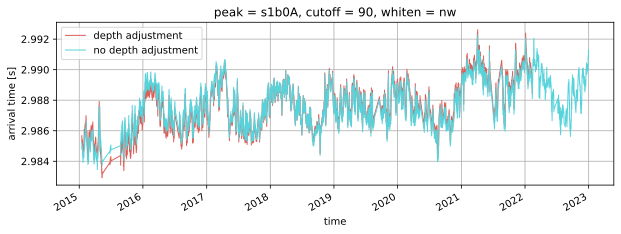

In [114]:
fig = plt.figure(figsize=(10,3))
at_depth_adjust.sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A'}).plot(label='depth adjustment', linewidth=1)
at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A'}).plot(label='no depth adjustment', linewidth=1)
plt.legend()
plt.grid()
plt.ylabel('arrival time [s]')

fig.savefig('figures/depth_adjustment.svg')

In [120]:
mae_da

<xarray.DataArray (peak: 2)>
array([0.00123519, 0.00120951])
Coordinates:
  * peak     (peak) object 's1b0A' 's1b0B'
    cutoff   <U2 '90'
    whiten   <U2 'nw'

In [68]:
mae_da = np.abs(at_depth_adjust.sel({'cutoff':'90', 'whiten':'nw', 'peak':['s1b0A','s1b0B']}) - (at_sim_full['201'].sel({'peak':'s1b0A'}) + 0.004844)).mean('time')

In [71]:
mae_da - mae

<xarray.DataArray (peak: 2)>
array([7.06997680e-05, 3.48533368e-05])
Coordinates:
  * peak     (peak) object 's1b0A' 's1b0B'
    cutoff   <U2 '90'
    whiten   <U2 'nw'

## Plot different time series

#### Best Results

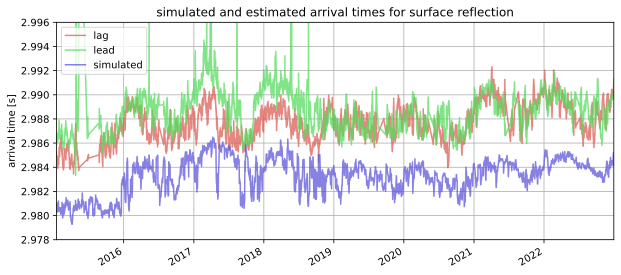

In [75]:
sns.set_palette('hls',3)
fig = plt.figure(figsize=(10,4))
(at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A'})).plot(label='lag', alpha=0.75)
(at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0B'})).plot(label='lead', alpha=0.75)
(at_sim['s1b0A']).plot(label='simulated', alpha=0.75)
plt.ylim([2.978, 2.996])
plt.xlim([at_full['201'].time[0], at_full['201'].time[-1]])
# plot time bins
#time_bins = np.arange(2.98, 3, 0.005)
#for k in range(len(time_bins)):
#    if k == 0:
#        plt.plot([at_full['201'].time[0].values, at_full['201'].time[-1].values], [time_bins[k], time_bins[k]], c='k', linewidth=1, label='time bins')
#    else:
#        plt.plot([at_full['201'].time[0].values, at_full['201'].time[-1].values], [time_bins[k], time_bins[k]], c='k', linewidth=1)
plt.grid()
plt.legend()
plt.ylabel('arrival time [s]')
plt.xlabel('')
plt.title('simulated and estimated arrival times for surface reflection')

fig.savefig('figures/surface_reflection_arrival_times_NoOffset.svg')

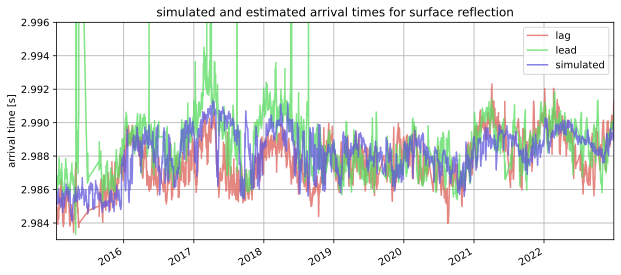

In [13]:
sns.set_palette('hls',3)
fig = plt.figure(figsize=(10,4))
(at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0A'})).plot(label='lag', alpha=0.75)
(at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':'s1b0B'})).plot(label='lead', alpha=0.75)
(at_sim['s1b0A'] + 0.004844).plot(label='simulated', alpha=0.75)
plt.ylim([2.983, 2.996])
plt.xlim([at_full['201'].time[0], at_full['201'].time[-1]])
# plot time bins
#time_bins = np.arange(2.98, 3, 0.005)
#for k in range(len(time_bins)):
#    if k == 0:
#        plt.plot([at_full['201'].time[0].values, at_full['201'].time[-1].values], [time_bins[k], time_bins[k]], c='k', linewidth=1, label='time bins')
#    else:
#        plt.plot([at_full['201'].time[0].values, at_full['201'].time[-1].values], [time_bins[k], time_bins[k]], c='k', linewidth=1)
plt.grid()
plt.legend()
plt.ylabel('arrival time [s]')
plt.xlabel('')
plt.title('simulated and estimated arrival times for surface reflection')

fig.savefig('figures/surface_reflection_arrival_times.svg')

#### 1 - 5 Hz
look at this frequency band for all other variables

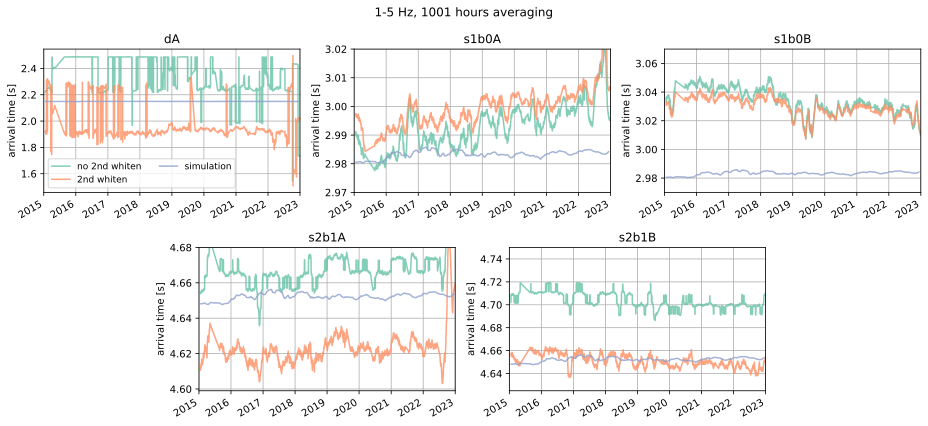

In [79]:
avg_hour = '1001'

sns.set_palette("Set2")

gs = gridspec.GridSpec(2, 6)

fig = plt.figure(figsize=(13,6))
fig.suptitle(f'1-5 Hz, {avg_hour} hours averaging')

ax1 = fig.add_subplot(gs[0,:2])
ax2 = fig.add_subplot(gs[0,2:4])
ax3 = fig.add_subplot(gs[0,4:6])
ax4 = fig.add_subplot(gs[1,1:3])
ax5 = fig.add_subplot(gs[1,3:5])

# direct pat
plt.sca(ax1)
(-1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'dA', 'whiten':'nw'}).plot(label='no 2nd whiten', c='C0', alpha=0.8)
(-1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'dA', 'whiten':'w'}).plot(label='2nd whiten', c='C1', alpha=0.8)
at_sim_full[avg_hour]['d'].plot(label='simulation', c='C2', alpha=0.8)
plt.legend(ncols=2, loc='lower left', fontsize=9)
plt.title('dA')
plt.ylabel('arrival time [s]')
plt.xlabel('')
plt.grid()
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.sca(ax2)
(-1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s1b0A', 'whiten':'nw'}).plot(label='no 2nd whiten', c='C0', alpha=0.8)
(-1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s1b0A', 'whiten':'w'}).plot(label='2nd whiten', c='C1', alpha=0.8)
at_sim_full[avg_hour]['s1b0'].plot(label='simulation', c='C2', alpha=0.8)
plt.title('s1b0A')
plt.ylim([2.97, 3.02])
plt.ylabel('arrival time [s]')
plt.xlabel('')
plt.grid()
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.sca(ax3)
(1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s1b0B', 'whiten':'nw'}).plot(label='no 2nd whiten', c='C0', alpha=0.8)
(1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s1b0B', 'whiten':'w'}).plot(label='2nd whiten', c='C1', alpha=0.8)
at_sim_full[avg_hour]['s1b0'].plot(label='simulation', c='C2', alpha=0.8)
plt.title('s1b0B')
plt.ylim([2.97, 3.07])
plt.ylabel('arrival time [s]')
plt.xlabel('')
plt.grid()
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.sca(ax4)
(-1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s2b1A', 'whiten':'nw'}).plot(label='no 2nd whiten', c='C0', alpha=0.8)
(-1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s2b1A', 'whiten':'w'}).plot(label='2nd whiten', c='C1', alpha=0.8)
at_sim_full[avg_hour]['s2b1'].plot(label='simulation', c='C2', alpha=0.8)
plt.title('s2b1A')
plt.ylim([4.599, 4.68])
plt.ylabel('arrival time [s]')
plt.xlabel('')
plt.grid()
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])

plt.sca(ax5)
(1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s2b1B', 'whiten':'nw'}).plot(label='no 2nd whiten', c='C0', alpha=0.8)
(1*at_full[avg_hour]).sel({'cutoff':'5', 'peak':'s2b1B', 'whiten':'w'}).plot(label='2nd whiten', c='C1', alpha=0.8)
at_sim_full[avg_hour]['s2b1'].plot(label='simulation', c='C2', alpha=0.8)
plt.title('s2b1B')
plt.ylim([4.625, 4.75])
plt.ylabel('arrival time [s]')
plt.xlabel('')
plt.grid()
plt.xlim([pd.Timestamp('2015-01-01'), pd.Timestamp('2023-01-01')])


plt.tight_layout()
fig.savefig(f'figures/1-5Hz_{avg_hour}.svg')

#### fc cutoff vs broadband

In [12]:
peaks = ['dA', 's1b0A', 's1b0B', 's2b1A','s2b1B']
avg_hours = ['201', '601', '1001']
whiten = ['nw','w']

sns.set_palette('hls',3)


ylims = [(2.1, 2.2), (2.98, 3.001),(2.98, 3.001), (4.7, 4.6), (4.62, 4.8)]

for white in whiten:
    for avg_hour in avg_hours:
        fig = plt.figure(figsize=(13,6))
        gs = gridspec.GridSpec(2, 6)
        if white == 'nw':
            fig.suptitle(f'{avg_hour} average hours, no second whitening')
        else:
            fig.suptitle(f'{avg_hour} average hours, with second whitening')
        ax1 = fig.add_subplot(gs[0,:2])
        ax2 = fig.add_subplot(gs[0,2:4])
        ax3 = fig.add_subplot(gs[0,4:6])
        ax4 = fig.add_subplot(gs[1, 1:3])
        ax5 = fig.add_subplot(gs[1, 3:5])

        axes = [ax1, ax2, ax3, ax4, ax5]

        for k, peak in enumerate(peaks):


            plt.sca(axes[k])
            if peak[-1] == 'A':
                (-1*at_full[avg_hour].sel({'cutoff':'fc', 'whiten':white, 'peak':f'{peak}'}))[::int(avg_hour)].plot(label=f'{peak} - fc', c='C0', alpha=0.75, linewidth=1)
                (-1*at_full[avg_hour].sel({'cutoff':'90', 'whiten':white, 'peak':f'{peak}'}))[::int(avg_hour)].plot(label=f'{peak} - 90', c='C1', alpha=0.75, linewidth=1)

            # skip lead if direct path
            else:
                if peak != 'd':
                    (at_full[avg_hour].sel({'cutoff':'fc', 'whiten':white, 'peak':f'{peak}'}))[::int(avg_hour)].plot(label=f'{peak} - fc', c='C0', alpha=0.75, linewidth=1)
                    (at_full[avg_hour].sel({'cutoff':'90', 'whiten':white, 'peak':f'{peak}'}))[::int(avg_hour)].plot(label=f'{peak} - 90', c='C1', alpha=0.75, linewidth=1)

            (at_sim_full[avg_hour][peak[:-1]]+0.005)[::int(avg_hour)].plot(c='C2', label='simulated', alpha=0.9, linewidth=1)

            plt.grid()
            #plt.ylim([2.98, 3.005])
            plt.legend(ncols=5, loc='upper right', fontsize=8)

            plt.xlabel('')
            plt.ylabel('arrival time [s]')
            plt.ylim(ylims[k])
            plt.title(peak)
            

        
        plt.tight_layout()
        fig.savefig(f'figures/fc_vs_broadband_{avg_hour}hrs_{white}.svg')
        plt.close()



##### rmse plot

In [9]:
peaks = ['dA', 's1b0A', 's1b0B', 's2b1A','s2b1B']
avg_hours = ['201', '601', '1001']
whiten = ['nw','w']

rmse_nw = {
    '201':{},
    '601':{},
    '1001':{}
}

rmse_w = {
    '201':{},
    '601':{},
    '1001':{}
}
rmse = {
    'w':rmse_w,
    'nw':rmse_nw
}

for avg_hour in avg_hours:
    for peak in peaks:
        for white in whiten:
            if peak[-1] == 'A':
                rmse[white][avg_hour][peak] = float(np.sqrt(((at_full[avg_hour].sel({'peak':peak, 'whiten':white}) + at_sim_full[avg_hour][peak[:-1]])**2).mean()))
            else:
                rmse[white][avg_hour][peak] = float(np.sqrt(((at_full[avg_hour].sel({'peak':peak, 'whiten':white}) - at_sim_full[avg_hour][peak[:-1]])**2).mean()))


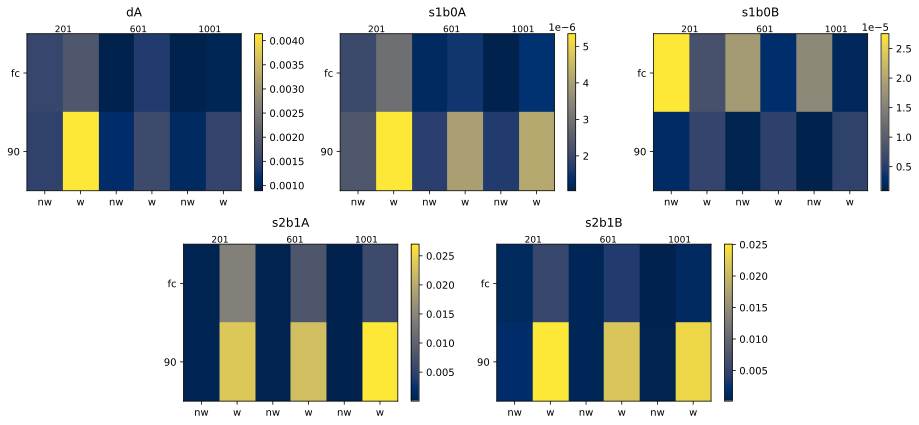

In [110]:
peaks = ['dA', 's1b0A', 's1b0B', 's2b1A','s2b1B']
avg_hours = ['201', '601', '1001']

sns.set_palette('hls',5)


fig = plt.figure(figsize=(13,6))
gs = gridspec.GridSpec(2, 6)

ax1 = fig.add_subplot(gs[0,:2])
ax2 = fig.add_subplot(gs[0,2:4])
ax3 = fig.add_subplot(gs[0,4:6])
ax4 = fig.add_subplot(gs[1, 1:3])
ax5 = fig.add_subplot(gs[1, 3:5])

axes = [ax1, ax2, ax3, ax4, ax5]

for k, peak in enumerate(peaks):
    plt.sca(axes[k])
    rmses = []
    if peak[-1] == 'A':
        for avg_hour in avg_hours:
            rmses.append(((at_full[avg_hour].sel({'peak':peak})[1:,:,::int(avg_hour)] + (at_sim_full[avg_hour][peak[:-1]][::int(avg_hour)]+0.005))**2).mean('time'))
    else:
        for avg_hour in avg_hours:
            rmses.append(((at_full[avg_hour].sel({'peak':peak})[1:,:,::int(avg_hour)] - (at_sim_full[avg_hour][peak[:-1]][::int(avg_hour)]+0.005))**2).mean('time'))

    # plot results
    rmse_single = xr.concat(rmses, dim='whiten')
    plt.imshow(rmse_single, cmap='cividis', aspect='auto')
    plt.colorbar()
    _ = plt.xticks(np.arange(6), rmse_single.whiten.values)
    _ = plt.yticks([0, 1], ['fc', '90'])
    
    axes[k].text(0.13, 1.01, '201', transform=axes[k].transAxes, fontsize=9)
    axes[k].text(0.48, 1.01, '601', transform=axes[k].transAxes, fontsize=9)
    axes[k].text(0.8, 1.01, '1001', transform=axes[k].transAxes, fontsize=9)
    axes[k].set_title(peak, y=1.2, pad=-14)
plt.tight_layout()
fig.savefig(f'figures/rmses.svg')

## Explore SNR based plots

### calculate SNR

In [9]:
fn = f'/datadrive/NCCFs/averaged/201.nc'
NCCFs = xr.open_dataarray(fn)

NCCFs = NCCFs.chunk({'time':100, 'delay':11999})

In [10]:
NCCFs_rms = np.sqrt((NCCFs**2).mean('delay'))
s1b0A_max = np.abs(xrsignal.hilbert(NCCFs.sel({'delay':slice(-3.5, -2.5)}), dim='time')).max('delay')
s1b0B_max = np.abs(xrsignal.hilbert(NCCFs.sel({'delay':slice(2.5, 3.5)}), dim='time')).max('delay')

In [11]:
SNR_s1b0A = (20*np.log10(s1b0A_max / NCCFs_rms)).compute()
SNR_s1b0B = (20*np.log10(s1b0B_max / NCCFs_rms)).compute()

/home/jhrag/anaconda3/envs/ooi_dev_archive/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/home/jhrag/anaconda3/envs/ooi_dev_archive/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/home/jhrag/anaconda3/envs/ooi_dev_archive/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/home/jhrag/anaconda3/envs/ooi_dev_archive/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=keepdims)
/home/jhrag/anaconda3/envs/ooi_dev_archive/lib/python3.10/site-packages/dask/array/reductions.py:640: RuntimeWarning: All-NaN slice encountered
  return np.nanmax(x_chunk, axis=axis, keepdims=

In [12]:
SNRs = xr.concat((SNR_s1b0A, SNR_s1b0A), dim='peak').assign_coords({'peak':['s1b0A', 's1b0B']})

### create plot

In [13]:
at_slice = at_full['201'].sel({'cutoff':'90', 'whiten':'nw', 'peak':['s1b0A', 's1b0B']})

In [14]:
at_snr = xr.Dataset({'SNR':SNRs, 'arrival_times':at_slice})

In [16]:
fig = plt.figure(figsize=(13,4))
at_snr.sel({'peak':'s1b0A'}).plot.scatter(x='time', y='arrival_times', hue='SNR', cmap='Blues', edgecolors=None, s=1, alpha=0.7, cbar_kwargs={'label':'SNR (lag)'})
at_snr.sel({'peak':'s1b0B'}).plot.scatter(x='time', y='arrival_times', hue='SNR', cmap='Reds', edgecolors=None, s=1, alpha=0.7, cbar_kwargs={'label':'SNR (lead)'})
(at_sim_full['201'].sel({'peak':'s1b0A'}) + 0.004844).plot(c='k')
plt.grid()
plt.ylim([2.984, 2.995])
plt.tight_layout()

fig.savefig('figures/SNR_arrivaltime.svg')
plt.close()